In [1]:
import networkx as nx
import pandas as pd
import scipy
import seaborn as sbn
import numpy as np

In [2]:
ortholog_groups = pd.read_csv('data/ortholog_groups.tsv', sep='\t')
ortholog_groups = ortholog_groups.drop('GCF_016801865.1.faa', axis=1)
ortholog_groups

,group_id,group_size,sp_in_grp,seed_ortholog_cnt,GCA_000441895.2.faa,GCF_000005575.2.faa,GCF_006496715.1.faa,GCF_013141755.1.faa,GCF_013758885.1.faa,GCF_015732765.1.faa,...,GCF_943734655.1.faa,GCF_943734665.1.faa,GCF_943734685.1.faa,GCF_943734695.1.faa,GCF_943734725.1.faa,GCF_943734745.1.faa,GCF_943734755.1.faa,GCF_943734845.2.faa,GCF_943737925.1.faa,GCF_002204515.2.faa
0,1,604,20,604,KFB45445.1,*,"XP_019534416.2,XP_019537733.2,XP_029707748.1,X...","XP_035890486.1,XP_035890546.1,XP_035890548.1,X...","XP_035774813.1,XP_035780876.1,XP_035780935.1,X...","XP_038106124.1,XP_038106215.1,XP_038106250.1,X...",...,"XP_053681622.1,XP_053681665.1,XP_053682608.1,X...",XP_050095375.1,"XP_040233459.2,XP_040240799.1,XP_049461225.1,X...","XP_050072605.1,XP_050072649.1,XP_050077807.1,X...","XP_053661558.1,XP_053661577.1,XP_053661808.1,X...","XP_049542547.1,XP_049542558.1,XP_049542559.1,X...","XP_052891389.1,XP_052891823.1,XP_052892561.1,X...","XP_049277100.1,XP_049277727.1,XP_049279403.1,X...","XP_053678616.1,XP_053678670.1",XP_021706494.1
1,2,593,21,593,KFB44859.1,XP_318577.4,"XP_019550573.2,XP_019550575.2,XP_019550615.1,X...","XP_035908586.1,XP_035908587.1,XP_035908588.1,X...","XP_035774579.1,XP_035774580.1,XP_035774581.1,X...",XP_038106739.1,...,"XP_053696339.1,XP_053696340.1,XP_053696341.1,X...","XP_050081888.1,XP_050081889.1,XP_050081890.1,X...","XP_049465177.1,XP_049465178.1,XP_049465179.1,X...","XP_050076690.1,XP_050076692.1,XP_050076693.1,X...",XP_053661628.1,"XP_049529748.1,XP_049529749.1,XP_049529750.1,X...","XP_052896605.1,XP_052896606.1,XP_052896607.1,X...","XP_049288636.1,XP_049288637.1,XP_049288638.1,X...",XP_053672424.1,"XP_021702309.1,XP_021702310.1,XP_021702311.1,X..."
2,3,583,21,583,KFB44005.1,"XP_001689103.1,XP_318122.4,XP_554647.3","XP_029720946.1,XP_029720947.1,XP_029720948.1,X...","XP_035912723.1,XP_035912724.1,XP_035912725.1,X...","XP_035791462.1,XP_035791463.1,XP_035791464.1,X...","XP_038108847.1,XP_038108848.1,XP_038108849.1,X...",...,XP_053688723.1,"XP_050094348.1,XP_050094349.1,XP_050094350.1,X...","XP_040221500.2,XP_049462194.1,XP_049462195.1,X...","XP_050073218.1,XP_050073219.1,XP_050073220.1,X...",XP_053661647.1,"XP_049543091.1,XP_049543092.1,XP_049543094.1,X...",XP_052894704.1,"XP_049294810.1,XP_049294811.1,XP_049294813.1,X...",XP_053672771.1,"XP_021708032.1,XP_021708033.1,XP_021708034.1,X..."
3,4,579,19,579,*,*,"XP_019531013.2,XP_029707759.1,XP_029708120.1,X...","XP_035890485.1,XP_035890489.1,XP_035890550.1,X...","XP_035789690.1,XP_035789695.1,XP_035792094.1","XP_038104717.1,XP_038106010.1,XP_038106182.1,X...",...,"XP_053681613.1,XP_053681638.1,XP_053685674.1,X...","XP_050087978.1,XP_050091400.1,XP_050091898.1","XP_040220550.2,XP_040225662.2,XP_040226826.2,X...","XP_050072320.1,XP_050072613.1,XP_050077223.1,X...","XP_053661557.1,XP_053661775.1,XP_053661796.1,X...","XP_049539022.1,XP_049542458.1","XP_052888152.1,XP_052888176.1,XP_052888229.1,X...","XP_049278095.1,XP_049279424.1,XP_049282141.1,X...","XP_053674046.1,XP_053674047.1,XP_053674050.1,X...","XP_021694215.1,XP_021711902.1"
4,5,572,21,572,KFB35461.1,XP_309810.4,"XP_029721280.1,XP_029721281.1,XP_029721282.1,X...","XP_035901213.1,XP_035901214.1,XP_035901215.1,X...","XP_035788141.1,XP_035788142.1,XP_035788143.1,X...","XP_038109783.1,XP_038109785.1,XP_038109786.1,X...",...,XP_053683718.1,XP_050096229.1,"XP_040238670.1,XP_040238671.1,XP_040238672.1,X...","XP_050081246.1,XP_050081247.1,XP_050081248.1,X...",XP_053659485.1,"XP_049546736.1,XP_049546737.1,XP_049546738.1,X...",XP_052901846.1,"XP_049290893.1,XP_049290894.1,XP_049290895.1,X...",XP_053670760.1,"XP_021705545.1,XP_021705546.1,XP_021705547.1,X..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15850,15851,2,2,2,*,*,*,*,*,*,...,*,*,*,*,*,*,XP_052889076.1,XP_049294092.1,*,*
15851,15852,2,2,2,*,*,*,*,*,*,...,*,*,*,*,*,*,XP_052892312.1,XP_049283855.1,*,*
15852,15853,2,2,2,*,*,*,*,*,*,...,*,*,*,*,*,*,XP_052892609.1,XP_049294257.1,*,*
15853,15854,2,2,2,*,*,*,*,*,*,...,*,*

In [3]:
relevant_species = ortholog_groups.columns[4:]
relevant_species = {sp.strip('.faa') for sp in relevant_species}
relevant_species

{'GCA_000441895.2',
 'GCF_000005575.2',
 'GCF_002204515.2',
 'GCF_006496715.1',
 'GCF_013141755.1',
 'GCF_013758885.1',
 'GCF_015732765.1',
 'GCF_016801865.2',
 'GCF_016920715.1',
 'GCF_017562075.2',
 'GCF_943734635.1',
 'GCF_943734655.1',
 'GCF_943734665.1',
 'GCF_943734685.1',
 'GCF_943734695.1',
 'GCF_943734725.1',
 'GCF_943734745.1',
 'GCF_943734755.1',
 'GCF_943734845.2',
 'GCF_943737925.1'}

In [4]:
from os import listdir
from os.path import isfile, join
import re
import itertools
import dask.dataframe as dd

path = './data/correspondences/'

files = [f for f in listdir(path) if isfile(join(path, f))]

g = nx.DiGraph()

all_species = set()
prot_to_species = {}

for file in files:
    if not file.endswith('csv'):
        continue
    print(file)
    species1, species2 = re.search(r'(.*)-(.*)\.csv', file).groups()
    if species1 not in relevant_species or species2 not in relevant_species:
        continue
    all_species.add(species1)
    all_species.add(species2)
    corresondences = pd.read_csv(join(path, file)) 
    corresondences = corresondences[corresondences['identity'] > 0]
    nodes = []
    edges = []
    for row in corresondences.iterrows():
        prot1, prot2, ident = row[1]
        prot_to_species[prot1] = species1
        prot_to_species[prot2] = species2
        nodes.append((prot1, {'species': species1}))
        nodes.append((prot2, {'species': species2}))
        edges.append((prot1, prot2, {'identity': ident}))
        # if int(ident) == 0:
        #     continue
        # g.add_node(prot1, species=species1)
        # g.add_node(prot2, species=species2)
        # # nx.set_node_attributes(g, {prot1: {'species': species1},
        # #                            prot2: {'species': species2}})
        # g.add_edge(prot1, prot2, identity=ident)
    g.add_nodes_from(nodes)
    g.add_edges_from(edges)

# corresondences = dd.read_csv(path + '*.csv', include_path_column=True)
# corresondences = corresondences[corresondences['identity'] > 0]
# nodes = []
# edges = []
# for row in corresondences.iterrows():
#     prot1, prot2, ident, path = row[1]
#     species1, species2 = re.search(r'.*(.*)-(.*)\.csv', path).groups()
#     all_species.add(species1)
#     all_species.add(species2)
#     prot_to_species[prot1] = species1
#     prot_to_species[prot2] = species2
#     nodes.append((prot1, {'species': species1}))
#     nodes.append((prot2, {'species': species2}))
#     edges.append((prot1, prot2, {'identity': ident}))
#     # if int(ident) == 0:
#     #     continue
#     # g.add_node(prot1, species=species1)
#     # g.add_node(prot2, species=species2)
#     # # nx.set_node_attributes(g, {prot1: {'species': species1},
#     # #                            prot2: {'species': species2}})
#     # g.add_edge(prot1, prot2, identity=ident)
# g.add_nodes_from(nodes)
# g.add_edges_from(edges)


GCF_029784165.1-GCF_943734705.1.csv
GCF_030247195.1-GCF_943734745.1.csv
GCF_030247195.1-GCF_943734665.1.csv
GCA_000441895.2-GCF_000005575.2.csv
GCF_943734665.1-GCF_943734745.1.csv
GCF_000005575.2-GCF_943734755.1.csv
GCF_030247195.1-GCF_943734845.2.csv
GCF_000005575.2-GCF_030247195.1.csv
GCF_943734655.1-GCF_943734685.1.csv
GCF_030247195.1-GCF_943734725.1.csv
GCF_016920715.1-GCF_943734745.1.csv
GCF_029784155.1-GCF_943734745.1.csv
GCF_006496715.1-GCF_016801865.2.csv
GCF_000005575.2-GCF_943734845.2.csv
GCF_016801865.2-GCF_943734755.1.csv
GCF_943734665.1-GCF_943734765.1.csv
GCF_015732765.1-GCF_943734755.1.csv
GCF_017562075.2-GCF_029784155.1.csv
GCF_006496715.2-GCF_029784135.1.csv
GCF_943734695.1-GCF_943735745.2.csv
GCF_016920715.1-GCF_017562075.2.csv
GCF_030247195.1-GCF_943734635.1.csv
GCF_030247195.1-GCF_943734755.1.csv
GCA_000441895.2-GCF_943737925.1.csv
GCF_943734665.1-GCF_943734685.1.csv
GCF_013758885.1-GCF_943734695.1.csv
GCF_943734635.1-GCF_943734745.1.csv
GCF_002204515.2-GCF_03024718

In [5]:
gu = g.to_undirected()

In [52]:

score = 0
max_score = g.number_of_nodes() * scipy.special.comb(len(all_species) - 1, 2)

for node, data in g.nodes(data=True):
    species = data['species']
    species_pairs = itertools.combinations(all_species - {species}, 2)
    for specie_pair in species_pairs:
        neighbors = g.neighbors(node)
        neighbors_in_specie_pair = [n for n in neighbors if g.nodes[n]['species'] in specie_pair]
        if len(neighbors_in_specie_pair) < 2:
            continue
        try:
            a, b = neighbors_in_specie_pair
        except:
            print(specie_pair)
            print(node, neighbors_in_specie_pair)
        if a in g.neighbors(b):
            score += 1

score / max_score

0.1641730818267426

In [60]:
nx.number_strongly_connected_components(g)

395606

In [58]:
nx.number_connected_components(gu)

7851

In [59]:
nx.number_weakly_connected_components(g)

7851

In [67]:
import seaborn as sbn

sizes = [len(comp) for comp in nx.weakly_connected_components(g)]
# sbn.histplot(sizes)

sorted(sizes, reverse=True)


[76158,
 2178,
 1605,
 1555,
 1518,
 1266,
 1232,
 1100,
 889,
 773,
 773,
 761,
 754,
 681,
 671,
 670,
 662,
 620,
 595,
 528,
 528,
 526,
 500,
 487,
 439,
 425,
 423,
 402,
 395,
 380,
 376,
 369,
 369,
 366,
 360,
 349,
 349,
 341,
 339,
 329,
 325,
 322,
 318,
 313,
 301,
 301,
 300,
 299,
 292,
 288,
 288,
 285,
 273,
 272,
 269,
 266,
 265,
 264,
 261,
 258,
 258,
 255,
 255,
 255,
 252,
 252,
 251,
 247,
 247,
 247,
 246,
 245,
 245,
 242,
 241,
 240,
 240,
 238,
 238,
 237,
 236,
 235,
 235,
 234,
 231,
 230,
 229,
 229,
 228,
 228,
 227,
 227,
 225,
 223,
 223,
 220,
 219,
 219,
 218,
 218,
 218,
 216,
 215,
 215,
 214,
 214,
 213,
 209,
 208,
 208,
 208,
 205,
 203,
 203,
 203,
 202,
 201,
 200,
 200,
 200,
 200,
 200,
 199,
 198,
 198,
 198,
 197,
 197,
 196,
 196,
 196,
 195,
 194,
 194,
 192,
 191,
 191,
 191,
 191,
 190,
 189,
 189,
 189,
 187,
 186,
 186,
 185,
 184,
 184,
 183,
 183,
 183,
 180,
 180,
 180,
 179,
 178,
 177,
 176,
 176,
 175,
 175,
 173,
 173,
 172,
 

In [71]:
nx.omega(gu)

: 

: 

<AxesSubplot: xlabel='group_size', ylabel='Count'>

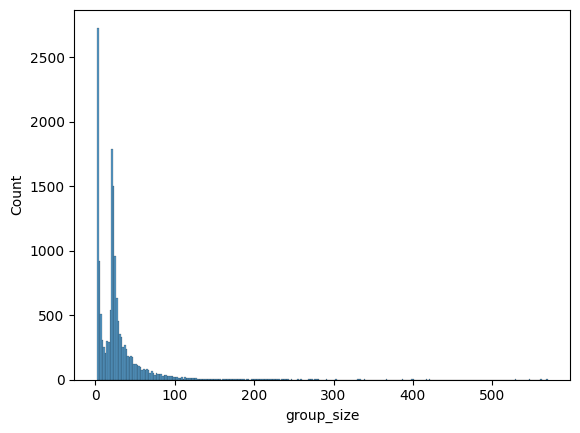

In [4]:
sbn.histplot(ortholog_groups['group_size'])

In [6]:

def percentage_complete(graph):
    n = graph.number_of_nodes()
    e = graph.number_of_edges()
    return e / (n*(n-1))


def compactness(graph):
    # weights = []
    # for pair in itertools.permutations(graph.nodes, 2):
    #     data = graph.get_edge_data(*pair)
    #     ident = data['identity'] if data else 0
    #     weights.append(ident)
    # return np.average(weights)
    return np.average([graph.get_edge_data(*pair)['identity'] for pair in graph.edges])


def distance(subgraph1, subgraph2, graph):
    weights = []
    for n1 in subgraph1.nodes:
        for n2 in subgraph2.nodes:
            data = graph.get_edge_data(n1, n2)
            if data:
                ident = data['identity'] # if data else 0
                weights.append(ident)

            # data = graph.get_edge_data(n2, n1)
            # if data:
            #     ident = data['identity'] # if data else 0
            #     weights.append(ident)
    return np.average(weights)


In [5]:
from analysis import SPECIES_ANTHROPOPHILY


anthropophilic_scores = []
non_anthropophilic_scores = []

results = []

for _, ortho_group in ortholog_groups.iterrows():
    genes = {gene: species.strip('.faa') for species, genes in ortho_group[4:].items() for gene in genes.split(',')}
    # genes = [gene for genes in ortho_group[1][4:] for gene in genes.split(',')]
    anthropophilic = [gene for gene, species in genes.items() if SPECIES_ANTHROPOPHILY[species] == 1]
    non_anthropophilic = [gene for gene, species in genes.items() if SPECIES_ANTHROPOPHILY[species] == -1]
    anthropophilic_subgraph = g.subgraph(anthropophilic)
    non_anthropophilic_subgraph = g.subgraph(non_anthropophilic)
    if anthropophilic_subgraph.number_of_nodes() > 1:
        # anthropophilic_scores.append(percentage_complete(anthropophilic_subgraph))
        anthropophilic_score = compactness(anthropophilic_subgraph)
        anthropophilic_scores.append(anthropophilic_score)
    if non_anthropophilic_subgraph.number_of_nodes() > 1:
        # non_anthropophilic_scores.append(percentage_complete(non_anthropophilic_subgraph))
        non_anthropophilic_score = compactness(non_anthropophilic_subgraph)
        non_anthropophilic_scores.append(non_anthropophilic_score)
    if anthropophilic_subgraph.number_of_nodes() > 7 and non_anthropophilic_subgraph.number_of_nodes() > 7:
        subgraphs_distance = distance(anthropophilic_subgraph, non_anthropophilic_subgraph, g)
        agg_score = anthropophilic_score * non_anthropophilic_score / (subgraphs_distance ** 2)
        results.append((ortho_group[0], agg_score, anthropophilic_score, non_anthropophilic_score, subgraphs_distance))

# print(sum(anthropophilic_scores)/len(anthropophilic_scores))
# print(sum(non_anthropophilic_scores)/len(non_anthropophilic_scores))

results = pd.DataFrame(results, columns=('group', 'agg_score', 'anthr_score', 'non_anthr_score', 'distance_score'))
results.sort_values('agg_score', ascending=False, inplace=True)
results


/home/mihail/mosquitoes/env/lib/python3.8/site-packages/numpy/lib/function_base.py:518: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/mihail/mosquitoes/env/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


,group,agg_score,anthr_score,non_anthr_score,distance_score
3171,3184,4.286043,52.216667,98.700,34.676471
3742,3767,3.500926,44.914286,94.940,34.900000
3912,3940,2.656220,45.342857,98.875,41.083333
3037,3050,2.652231,54.815385,90.800,43.320000
2790,2799,2.608928,38.716667,93.150,37.180000
...,...,...,...,...,...
5812,6153,NaN,NaN,98.250,39.055556
5890,6270,NaN,73.746154,NaN,44.320000
6640,7683,NaN,54.172727,NaN,58.365385
7039,9928,NaN,NaN,52.590,59.928571


<AxesSubplot: xlabel='agg_score', ylabel='Count'>

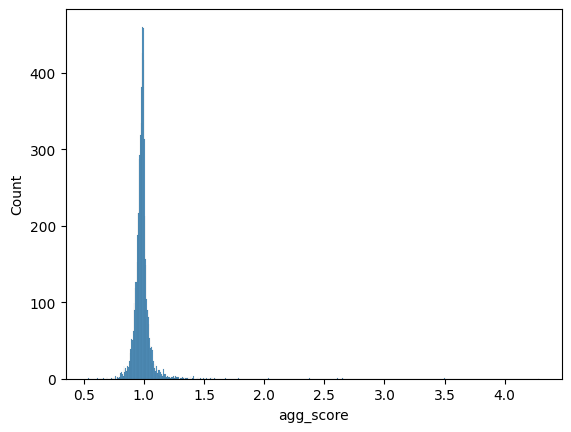

In [6]:
sbn.histplot(results['agg_score'])


In [7]:
results[results['agg_score'] > 1.5]

,group,agg_score,anthr_score,non_anthr_score,distance_score
3171,3184,4.286043,52.216667,98.700000,34.676471
3742,3767,3.500926,44.914286,94.940000,34.900000
3912,3940,2.656220,45.342857,98.875000,41.083333
3037,3050,2.652231,54.815385,90.800000,43.320000
2790,2799,2.608928,38.716667,93.150000,37.180000
2581,2588,2.373654,46.806667,91.120000,42.388889
588,589,2.036212,63.854545,97.925000,55.415493
5380,5587,1.786025,34.166667,76.450000,38.242500
2675,2682,1.676157,58.628571,91.962500,56.715625
230,231,1.590677,38.358750,82.580769,44.625248


In [5]:
from Bio import SeqIO

path = './data/sequences/'

protein_seqs = {}

files = [f for f in listdir(path) if isfile(join(path, f))]
for file in files:
    if not file.endswith('.faa'):
        continue
    for record in SeqIO.parse(path + file, "fasta"):
        protein_seqs[str(record.id)] = record.seq
    
print(len(protein_seqs))


413349


In [47]:
from Bio import pairwise2
from Bio.Align import substitution_matrices

blosum62 = substitution_matrices.load("BLOSUM62")

pairwise_alignments = {}

def avg_within_group_score(genes):
    scores = []
    for g1 in genes:
        for g2 in genes:
            if g1 == g2:
                continue
            seq1 = protein_seqs[g1]
            seq2 = protein_seqs[g2]
            key = tuple(sorted([seq1, seq2]))
            print(key)
            if key not in pairwise_alignments:
                score = pairwise2.align.globalds(seq1, seq2, blosum62, -11, -1, score_only=True)
                pairwise_alignments[key] = score
            else:
                score = pairwise_alignments[key]

            # if len(alignments) > 1:
            #     print(len(alignments))
            #     raise Exception('Too many alignments?')
            # alignment = alignments[0]
            # scores.append(alignment.score)
            scores.append(score)
    return np.average(scores)

for _, ortho_group in ortholog_groups.iterrows():
    genes = {gene: species.strip('.faa') for species, genes in ortho_group[4:].items() for gene in genes.split(',')}
    anthropophilic = [gene for gene, species in genes.items() if SPECIES_ANTHROPOPHILY[species] == 1]
    non_anthropophilic = [gene for gene, species in genes.items() if SPECIES_ANTHROPOPHILY[species] == -1]
    print(len(anthropophilic))
    score = avg_within_group_score(anthropophilic)
    print(score)
    break
    



299
(Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFRPFTRESLAAIERRIADAEAKQRELEKKRAEGETGFGR...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFRPFTRESLAAIERRIADAEAKQRELEKKRAEGETGFGR...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFRPFTRESLAAIERRIADAEAKQRELEKKRAEGETGFGR...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFRPFTRESLAAIERRIADAEAKQRELEKKRAEGETGFGR...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFRPFTRESLAAIERRIADAEAKQRELEKKRAEGETGFGR...ADV'), Seq('MTEDSDSISEEERSLFRPFTRESLQAIEARIADEEAKQRELERKRAEGEDEDEG...ADV'))
(Seq('MTEDSDSISEEERSLFR

In [7]:
# ortholog_groups[ortholog_groups['sp_in_grp'] >= 21]
ortholog_groups = ortholog_groups.replace('*', None)
ortholog_groups.dropna()

,group_id,group_size,sp_in_grp,seed_ortholog_cnt,GCA_000441895.2.faa,GCF_000005575.2.faa,GCF_006496715.1.faa,GCF_013141755.1.faa,GCF_013758885.1.faa,GCF_015732765.1.faa,...,GCF_943734655.1.faa,GCF_943734665.1.faa,GCF_943734685.1.faa,GCF_943734695.1.faa,GCF_943734725.1.faa,GCF_943734745.1.faa,GCF_943734755.1.faa,GCF_943734845.2.faa,GCF_943737925.1.faa,GCF_002204515.2.faa
1,2,593,21,593,KFB44859.1,XP_318577.4,"XP_019550573.2,XP_019550575.2,XP_019550615.1,X...","XP_035908586.1,XP_035908587.1,XP_035908588.1,X...","XP_035774579.1,XP_035774580.1,XP_035774581.1,X...",XP_038106739.1,...,"XP_053696339.1,XP_053696340.1,XP_053696341.1,X...","XP_050081888.1,XP_050081889.1,XP_050081890.1,X...","XP_049465177.1,XP_049465178.1,XP_049465179.1,X...","XP_050076690.1,XP_050076692.1,XP_050076693.1,X...",XP_053661628.1,"XP_049529748.1,XP_049529749.1,XP_049529750.1,X...","XP_052896605.1,XP_052896606.1,XP_052896607.1,X...","XP_049288636.1,XP_049288637.1,XP_049288638.1,X...",XP_053672424.1,"XP_021702309.1,XP_021702310.1,XP_021702311.1,X..."
2,3,583,21,583,KFB44005.1,"XP_001689103.1,XP_318122.4,XP_554647.3","XP_029720946.1,XP_029720947.1,XP_029720948.1,X...","XP_035912723.1,XP_035912724.1,XP_035912725.1,X...","XP_035791462.1,XP_035791463.1,XP_035791464.1,X...","XP_038108847.1,XP_038108848.1,XP_038108849.1,X...",...,XP_053688723.1,"XP_050094348.1,XP_050094349.1,XP_050094350.1,X...","XP_040221500.2,XP_049462194.1,XP_049462195.1,X...","XP_050073218.1,XP_050073219.1,XP_050073220.1,X...",XP_053661647.1,"XP_049543091.1,XP_049543092.1,XP_049543094.1,X...",XP_052894704.1,"XP_049294810.1,XP_049294811.1,XP_049294813.1,X...",XP_053672771.1,"XP_021708032.1,XP_021708033.1,XP_021708034.1,X..."
4,5,572,21,572,KFB35461.1,XP_309810.4,"XP_029721280.1,XP_029721281.1,XP_029721282.1,X...","XP_035901213.1,XP_035901214.1,XP_035901215.1,X...","XP_035788141.1,XP_035788142.1,XP_035788143.1,X...","XP_038109783.1,XP_038109785.1,XP_038109786.1,X...",...,XP_053683718.1,XP_050096229.1,"XP_040238670.1,XP_040238671.1,XP_040238672.1,X...","XP_050081246.1,XP_050081247.1,XP_050081248.1,X...",XP_053659485.1,"XP_049546736.1,XP_049546737.1,XP_049546738.1,X...",XP_052901846.1,"XP_049290893.1,XP_049290894.1,XP_049290895.1,X...",XP_053670760.1,"XP_021705545.1,XP_021705546.1,XP_021705547.1,X..."
7,8,429,21,429,"KFB38258.1,KFB38259.1,KFB42458.1,KFB51644.1,KF...","XP_001237386.2,XP_001687934.1,XP_001688318.2,X...","XP_019525930.2,XP_019525992.2,XP_019527202.2,X...","XP_035890602.1,XP_035892474.1,XP_035892478.1,X...","XP_035784211.1,XP_035786836.1,XP_035787484.1,X...","XP_001842116.2,XP_001843347.2,XP_001846098.1,X...",...,"XP_053682963.1,XP_053684725.1,XP_053684728.1,X...","XP_050090739.1,XP_050091171.1,XP_050091172.1,X...","XP_040224026.1,XP_040224027.2,XP_040225203.1,X...","XP_050067593.1,XP_050075732.1,XP_050075734.1,X...","XP_053659734.1,XP_053659736.1,XP_053661877.1,X...","XP_049540065.1,XP_049540596.1,XP_049541908.1,X...","XP_052889796.1,XP_052890381.1,XP_052890384.1,X...","XP_049280210.1,XP_049284483.1,XP_049284484.1,X...","XP_053673275.1,XP_053674272.1,XP_053674274.1,X...","XP_001647954.2,XP_001647955.1,XP_001647973.1,X..."
8,9,423,21,423,"KFB35068.1,KFB35069.1,KFB35163.1,KFB35221.1,KF...","XP_001688353.2,XP_306795.2,XP_307353.3,XP_3102...","XP_029710348.1,XP_029729761.1,XP_029731244.1","XP_035890620.1,XP_035890627.1,XP_035890660.1,X...","XP_035773514.1,XP_035791100.1,XP_035792095.1,X...","XP_038106602.1,XP_038117988.1",...,"XP_053685668.1,XP_053691307.1,XP_053699460.1","XP_050091948.1,XP_050092062.1,XP_050092254.1,X...","XP_040219962.2,XP_040226220.2,XP_040228192.2,X...","XP_050070462.1,XP_050070474.1,XP_050070485.1,X...","XP_053658161.1,XP_053658189.1,XP_053660379.1,X...","XP_049531496.1,XP_049541717.1","XP_052888929.1,XP_052889146.1,XP_052890163.1,X...","XP_049277605.1,XP_049277607.1,XP_049277608.1,X...","XP_053674045.1,XP_053674051.1,XP_053678673.1","XP_001663558.2,XP_021698336.1,XP_021705627.1,X..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

/tmp/ipykernel_1165/3541875580.py:35: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  group1 = set(random.sample(genes.keys(), len(anthropophilic)))


100
200
300
400


/home/mihail/mosquitoes/env/lib/python3.9/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/mihail/mosquitoes/env/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


500
600


/home/mihail/mosquitoes/env/lib/python3.9/site-packages/scipy/stats/_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
/home/mihail/mosquitoes/env/lib/python3.9/site-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/tmp/ipykernel_1165/3541875580.py:61: RuntimeWarning: invalid value encountered in scalar divide
  std_dev_dist = (anthropophily_division_score - mean_rand_division_score) / std


700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300


/home/mihail/mosquitoes/env/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/mihail/mosquitoes/env/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


,mean,std,anthropophily_division_score,std_dev_dist
0,0.998658,0.023514,0.953237,-1.931639
1,0.999712,0.005240,1.007782,1.540004
2,0.997169,0.015301,1.023178,1.699863
3,0.998117,0.055916,1.163209,2.952493
4,0.999399,0.062296,0.987828,-0.185728
...,...,...,...,...
6388,1.001617,0.077210,0.971587,-0.388941
6389,1.013855,0.078298,0.975661,-0.487806
6390,0.995862,0.037081,0.989592,-0.169080
6391,1.001091,0.005866,0.997780,-0.564587


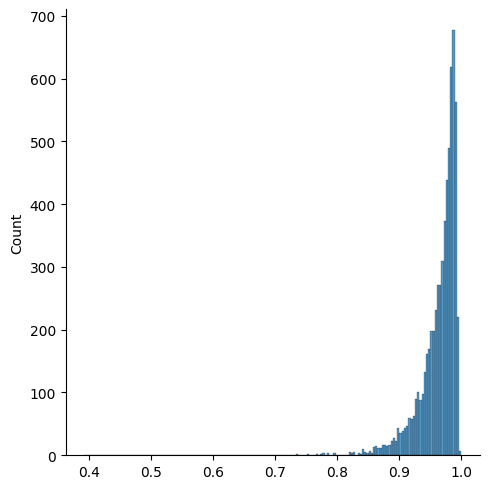

In [15]:
import random
import math
from scipy.stats import shapiro
from analysis import SPECIES_ANTHROPOPHILY

# big_ortho_groups = ortholog_groups[ortholog_groups['group_size'] >= 10]
# common_ortho_groups = ortholog_groups[ortholog_groups['sp_in_grp'] >= 20]
common_ortho_groups = ortholog_groups.dropna()

shapiros = []
p_vals = []
res = []

it = 0

for _, ortho_group in common_ortho_groups.iterrows():
    it += 1
    if it % 100 == 0:
        print(it)
    genes = {gene: species.strip('.faa') for species, genes in ortho_group[4:].items() for gene in genes.split(',')}
    # genes = [gene for genes in ortho_group[1][4:] for gene in genes.split(',')]
    anthropophilic = [gene for gene, species in genes.items() if SPECIES_ANTHROPOPHILY[species] == 1]
    non_anthropophilic = [gene for gene, species in genes.items() if SPECIES_ANTHROPOPHILY[species] == -1]
    anthropophilic_subgraph = gu.subgraph(anthropophilic)
    non_anthropophilic_subgraph = gu.subgraph(non_anthropophilic)
    anthropophilic_compactness = compactness(anthropophilic_subgraph)
    non_anthropophilic_compactness = compactness(non_anthropophilic_subgraph)
    anthropophily_groups_distance = distance(anthropophilic_subgraph,
                                             non_anthropophilic_subgraph,
                                             gu)
    anthropophily_division_score = anthropophilic_compactness * non_anthropophilic_compactness / (anthropophily_groups_distance ** 2)

    random_division_scores = []
    for i in range(100):
        group1 = set(random.sample(genes.keys(), len(anthropophilic)))
        group2 = genes.keys() - group1

        group1_subgraph = g.subgraph(group1).to_undirected()
        group2_subgraph = g.subgraph(group2).to_undirected()

        compactness1 = compactness(group1_subgraph)
        compactness2 = compactness(group2_subgraph)
        subgraphs_distance = distance(group1_subgraph, group2_subgraph, g)
        agg_score = compactness1 * compactness2 / (subgraphs_distance ** 2)
        random_division_scores.append(agg_score)
    mean_rand_division_score = np.average(random_division_scores)
    # print(random_division_scores)

    shapiro_stat, shapiro_p = scipy.stats.shapiro(random_division_scores)
    # print(shapiro_stat, shapiro_p)
    shapiros.append(shapiro_stat)
    
    stat, p = scipy.stats.ttest_1samp(random_division_scores, anthropophily_division_score, alternative='less')
    p_vals.append((ortho_group['group_id'], stat, p))
    
    # fit a normal distribution to the random_division_scores
    # dist = scipy.stats.fit(scipy.stats.norm, random_division_scores)
    std = np.std(random_division_scores)
    # dist = scipy.stats.norm(mean_rand_division_score, np.std(random_division_scores))
    # get how many standard deviations from the mean the anthropophily_division_score is
    std_dev_dist = (anthropophily_division_score - mean_rand_division_score) / std
    res.append((mean_rand_division_score, std, anthropophily_division_score, std_dev_dist))
    
    # sbn.displot(random_division_scores)
    # print(random_division_scores)
    
    # print(scipy.stats.norm.fit(random_division_scores))

# print(np.median(shapiros))

sbn.displot(shapiros)
p_vals = pd.DataFrame(p_vals, columns=('group_id', 'stat', 'p'))
res = pd.DataFrame(res, columns=('mean', 'std', 'anthropophily_division_score', 'std_dev_dist'))
# res['p'] = scipy.stats.false_discovery_control(res['p'])
res


In [29]:
res.sort_values('std_dev_dist', ascending=False).dropna()

,mean,std,anthropophily_division_score,std_dev_dist
28,0.999959,0.011069,1.054658,4.941886
1210,0.981095,0.088951,1.321336,3.825051
1096,0.997888,0.006531,1.021621,3.634106
1412,1.001464,0.095014,1.339865,3.561596
362,1.023168,0.150125,1.541957,3.455727
...,...,...,...,...
249,0.996213,0.042049,0.836494,-3.798414
902,1.001859,0.026447,0.897661,-3.939840
145,0.999036,0.013165,0.946677,-3.977134
552,1.008290,0.042333,0.837261,-4.040061


/tmp/ipykernel_1165/591348016.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sbn.distplot(res['std'])
/home/mihail/mosquitoes/env/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/mihail/mosquitoes/env/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: xlabel='std', ylabel='Density'>

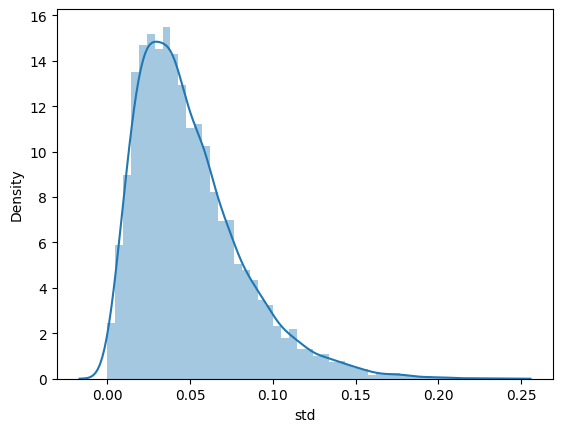

In [34]:
sbn.distplot(res['std'])

In [38]:
sorted_res = res.sort_values('std_dev_dist', ascending=False).dropna()
anthropophily_genes = sorted_res[sorted_res['std_dev_dist'] > 3]
anthropophily_genes

,mean,std,anthropophily_division_score,std_dev_dist
28,0.999959,0.011069,1.054658,4.941886
1210,0.981095,0.088951,1.321336,3.825051
1096,0.997888,0.006531,1.021621,3.634106
1412,1.001464,0.095014,1.339865,3.561596
362,1.023168,0.150125,1.541957,3.455727
528,1.023031,0.149880,1.531099,3.389845
664,1.000491,0.008688,1.029884,3.383191
112,0.999600,0.044660,1.150131,3.370579
2319,0.994970,0.051936,1.166447,3.301723
2587,0.976519,0.092425,1.271294,3.189332


In [40]:
ortholog_groups[ortholog_groups['group_id'].isin(anthropophily_genes.index)]

,group_id,group_size,sp_in_grp,seed_ortholog_cnt,GCA_000441895.2.faa,GCF_000005575.2.faa,GCF_006496715.1.faa,GCF_013141755.1.faa,GCF_013758885.1.faa,GCF_015732765.1.faa,...,GCF_943734655.1.faa,GCF_943734665.1.faa,GCF_943734685.1.faa,GCF_943734695.1.faa,GCF_943734725.1.faa,GCF_943734745.1.faa,GCF_943734755.1.faa,GCF_943734845.2.faa,GCF_943737925.1.faa,GCF_002204515.2.faa
27,28,265,21,265,KFB41393.1,"XP_003435829.1,XP_003435830.1,XP_321696.3",XP_019548989.2,"XP_035899422.1,XP_035899423.1,XP_035899424.1,X...","XP_035779179.1,XP_035779180.1,XP_035779181.1,X...","XP_038121534.1,XP_038121536.1,XP_038121537.1,X...",...,XP_053696145.1,"XP_050086008.1,XP_050086009.1,XP_050086010.1,X...","XP_040221207.1,XP_040240667.1,XP_040240668.1,X...","XP_050069801.1,XP_050069802.1,XP_050069803.1,X...","XP_053660866.1,XP_053660867.1,XP_053660868.1,X...","XP_049535414.1,XP_049535416.1,XP_049535417.1,X...","XP_052888269.1,XP_052888270.1,XP_052888271.1,X...","XP_049278498.1,XP_049278499.1,XP_049278500.1,X...","XP_053671580.1,XP_053671581.1,XP_053671582.1","XP_001662897.2,XP_021704264.1,XP_021704265.1,X..."
111,112,167,20,167,KFB45610.1,XP_317088.3,"XP_029708903.1,XP_029708911.1,XP_029708912.1,X...","XP_035917627.1,XP_035917628.1,XP_035917629.1,X...","XP_035781234.1,XP_035781235.1,XP_035781236.1,X...","XP_038106489.1,XP_038106490.1,XP_038106491.1,X...",...,"XP_053692789.1,XP_053692790.1,XP_053692791.1,X...","XP_050081676.1,XP_050081677.1,XP_050081678.1,X...",None,XP_050076546.1,XP_053666614.1,"XP_049537261.1,XP_049537262.1,XP_049537263.1,X...","XP_052898512.1,XP_052898513.1,XP_052898514.1,X...","XP_049282251.1,XP_049282252.1,XP_049282254.1,X...",XP_053673860.1,"XP_021702192.1,XP_021702193.1,XP_021702194.1,X..."
270,271,122,21,122,KFB51359.1,XP_308469.4,"XP_019560057.2,XP_019560058.2,XP_019560059.2,X...","XP_035907404.1,XP_035907405.1,XP_035907406.1,X...","XP_035791645.1,XP_035791646.1,XP_035791647.1,X...",XP_038115989.1,...,"XP_053689436.1,XP_053689437.1,XP_053689438.1,X...","XP_050095266.1,XP_050095267.1,XP_050095268.1,X...","XP_040225317.2,XP_040225319.2,XP_040225320.2,X...","XP_050073460.1,XP_050073461.1,XP_050073462.1",XP_053667185.1,"XP_049541658.1,XP_049541659.1,XP_049541660.1,X...","XP_052892519.1,XP_052892520.1,XP_052892521.1,X...","XP_049297660.1,XP_049297661.1,XP_049297662.1,X...",XP_053673098.1,"XP_021699297.1,XP_021699298.1,XP_021699299.1,X..."
361,362,111,21,111,KFB49615.1,XP_317515.4,"XP_019559479.2,XP_019559480.2,XP_029714204.1,X...","XP_035916197.1,XP_035916198.1,XP_035916199.1","XP_035774177.1,XP_035774179.1,XP_035774180.1,X...","XP_001843039.1,XP_038109104.1,XP_038109105.1,X...",...,"XP_053697805.1,XP_053697806.1,XP_053697807.1","XP_050083191.1,XP_050083192.1,XP_050083194.1","XP_040236841.2,XP_040236842.2,XP_040236843.2,X...",XP_050077423.1,XP_053662318.1,"XP_049549000.1,XP_049549001.1,XP_049549002.1,X...","XP_052892232.1,XP_052892233.1","XP_049287961.1,XP_049287963.1,XP_049287964.1,X...",XP_053672183.1,"XP_001653456.2,XP_021700266.1,XP_021700267.1,X..."
527,528,96,21,96,KFB43966.1,XP_318175.4,"XP_019931340.2,XP_019933369.1,XP_019933371.1,X...","XP_035907391.1,XP_035907392.1,XP_035907393.1,X...","XP_035793370.1,XP_035793372.1,XP_035793373.1,X...",XP_038107997.1,...,XP_053684257.1,"XP_050092736.1,XP_050092737.1,XP_050092738.1,X...","XP_040219793.1,XP_040219794.1,XP_040219795.1,X...","XP_050074133.1,XP_050074134.1,XP_050074135.1,X...",XP_053663499.1,"XP_049543372.1,XP_049543373.1,XP_049543374.1,X...","XP_052894012.1,XP_052894013.1,XP_052894014.1,X...","XP_049295145.1,XP_049295146.1,XP_049295147.1,X...",XP_053677522.1,"XP_021709612.1,XP_021709613.1,XP_021709614.1,X..."
663,664,88,19,88,None,None,"XP_029715708.1,XP_029724475.1,XP_029724518.1,X...","XP_035892841.1,XP_035892843.1,XP_035892844.1,X...","XP_035791927.1,XP_035791928.1,XP_035791929.1","XP_038109324.1,XP_038109325.1,XP_038109326.1,X...",...,"XP_053688641.1,XP_053688642.1,XP_053688643.1,X...","XP_050095284.1,XP_050095285.1","XP_040231608.2,XP_040231611.2,XP_049466652.1","XP_0500800

In [73]:

predicted_proteins = ortholog_groups[ortholog_groups['group_id'].isin(anthropophily_genes.index)]
# get all unique values in columns 5-end
predicted_proteins_list = {y for x in predicted_proteins.iloc[:, 4:].values.flatten() if x for y in x.split(',')}
for x in predicted_proteins_list:
    print(x)

XP_021704274.1
XP_052895995.1
XP_041781792.1
XP_035779190.1
XP_049278502.1
XP_049549014.1
XP_021709980.1
XP_049282257.1
XP_040230404.2
XP_035904896.1
XP_050081686.1
XP_041781794.1
XP_050092738.1
XP_050086016.1
XP_021699303.1
XP_029728377.1
XP_053681582.1
XP_035779189.1
XP_039431240.1
XP_040171453.1
XP_050092748.1
XP_021702196.1
XP_053694478.1
XP_040158259.1
XP_040219797.1
XP_029714244.1
XP_041785045.1
XP_041767580.1
XP_040165451.1
XP_041768834.1
XP_035781620.1
XP_052873504.1
XP_040175892.1
XP_052892128.1
XP_029714353.1
XP_040159844.1
XP_040232509.2
XP_021704275.1
XP_021702198.1
XP_035917635.1
XP_038106499.1
XP_035791928.1
XP_049545206.1
XP_050081687.1
XP_040159833.1
XP_038106496.1
XP_019933373.1
XP_021705120.1
XP_035778253.1
XP_049278508.1
XP_039431229.1
XP_050095274.1
XP_001653456.2
XP_029735628.1
XP_053660875.1
XP_029713537.1
XP_035912103.1
XP_049288336.1
XP_049537273.1
XP_317515.4
XP_035779194.1
XP_049461400.1
XP_035904899.1
XP_040230400.2
XP_040223443.2
XP_040232508.2
XP_040159847.

In [69]:
# convert the ncbi protein ids to ncbi gene ids
import re
from Bio import Entrez

Entrez.email = 'mihail0zdravkov@gmail.com'

gene_ids = []

for protein in predicted_proteins:
    handle = Entrez.esearch(db='protein', term=protein)
    record = Entrez.read(handle)
    handle.close()
    if record['Count'] == '0':
        continue
    gene_id = record['IdList'][0]
    gene_ids.append(gene_id)

print(len(gene_ids))

KeyboardInterrupt: 

In [17]:
from statsmodels.stats.multitest import multipletests

rejected, p_values_corrected, _, _ = multipletests(p_vals['p'], alpha=0.01, method='fdr_bh')
# p_values_corrected
significant_groups = p_vals[rejected].sort_values('p')
significant_groups


,group_id,stat,p
28,42,-49.171143,1.128376e-71
1210,1623,-38.058774,3.263595e-61
1096,1460,-36.158894,3.707411e-59
1412,1905,-35.437436,2.366283e-58
362,480,-34.384050,3.757921e-57
...,...,...,...
1593,2158,-3.099944,1.260315e-03
2394,3312,-3.097661,1.269189e-03
929,1240,-3.096282,1.274575e-03
3226,4618,-3.090114,1.298933e-03


/home/mihail/mosquitoes/env/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/mihail/mosquitoes/env/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='p', ylabel='std_dev_dist'>

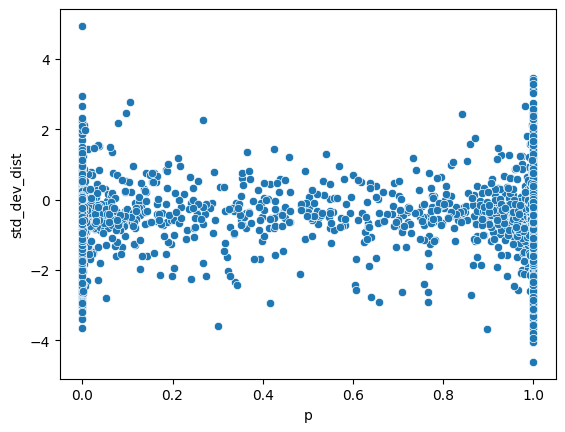

In [28]:
# plot correlation between p_vals and std_dev_dist

p_val_to_std_dev = res.join(p_vals.set_index('group_id'))[['p', 'std_dev_dist']].dropna()
sbn.scatterplot(p_val_to_std_dev, x='p', y='std_dev_dist')



In [71]:
aedes_genes = pd.read_csv('data/tableS3.txt', sep='\t')
aedes_genes

,chr,start,end,gene,outlierSNPs,pvalues,outlierRegion
0,1,14291304,14881186,ID=AAEL021365;biotype=protein_coding;version=2,14322574;14322804;14398761,8.18106270604807e-11;2.56978768159925e-09;1.53...,0
1,1,15026962,15108330,ID=AAEL011287;biotype=protein_coding;descripti...,15063777,8.46858337982644e-09,0
2,1,15876509,15969265,ID=AAEL004180;biotype=protein_coding;version=2,15942876;15944125;15945140,3.1588841921745e-10;1.03508194963352e-09;8.926...,0
3,1,15893748,15945374,ID=AAEL004179;biotype=protein_coding;version=2,15942876;15944125;15945140,3.1588841921745e-10;1.03508194963352e-09;8.926...,0
4,1,16014383,16443984,ID=AAEL011359;biotype=protein_coding;descripti...,16063734;16067536;16119045;16131794;16236443;1...,7.72571672574266e-10;2.77132269303659e-11;3.36...,0
...,...,...,...,...,...,...,...
1744,3,395144532,395145604,ID=AAEL000677;biotype=protein_coding;descripti...,395144722,5.0874538249049e-09,0
1745,3,395239026,395241176,ID=AAEL000647;biotype=protein_coding;version=2,395240481;395240546,1.64269942574472e-09;3.68120698629884e-10,0
1746,3,395288097,395302686,ID=AAEL000634;biotype=protein_coding;descripti...,395299567;395300016;395301148,6.39736898653041e-11;3.16674428621467e-15;3.49...,0
1747,3,405923547,406255713,ID=AAEL019951;biotype=protein_coding;version=1,405928974;405980365,3.30236913220076e-09;7.73798271956067e-09,0


In [89]:
aedes_gene_ids = aedes_genes['gene'].str.split(';').apply(lambda x: x[0].strip('ID='))

aedes_id = 'GCF_002204515.2.faa'
# significant_aedes_genes = set(significant_groups.join(ortholog_groups.set_index('group_id'), on='group_id', how='left')[aedes_id].apply(lambda x: x.split(',')).sum())
# len(significant_aedes_genes)
aedes_gene_ids
significant_aedes_genes = set(predicted_proteins[aedes_id].apply(lambda x: x.split(',')).sum())
significant_aedes_genes

{'XP_001652883.2',
 'XP_001652884.2',
 'XP_001653456.2',
 'XP_001660900.1',
 'XP_001662897.2',
 'XP_011493653.2',
 'XP_021695116.1',
 'XP_021696446.1',
 'XP_021698489.1',
 'XP_021699297.1',
 'XP_021699298.1',
 'XP_021699299.1',
 'XP_021699300.1',
 'XP_021699301.1',
 'XP_021699302.1',
 'XP_021699303.1',
 'XP_021699304.1',
 'XP_021699305.1',
 'XP_021699306.1',
 'XP_021700266.1',
 'XP_021700267.1',
 'XP_021700268.1',
 'XP_021700270.1',
 'XP_021701417.1',
 'XP_021701418.1',
 'XP_021702192.1',
 'XP_021702193.1',
 'XP_021702194.1',
 'XP_021702195.1',
 'XP_021702196.1',
 'XP_021702197.1',
 'XP_021702198.1',
 'XP_021702199.1',
 'XP_021702200.1',
 'XP_021702201.1',
 'XP_021702203.1',
 'XP_021702204.1',
 'XP_021703765.1',
 'XP_021703766.1',
 'XP_021703767.1',
 'XP_021703768.1',
 'XP_021703769.1',
 'XP_021704264.1',
 'XP_021704265.1',
 'XP_021704266.1',
 'XP_021704267.1',
 'XP_021704268.1',
 'XP_021704269.1',
 'XP_021704270.1',
 'XP_021704271.1',
 'XP_021704272.1',
 'XP_021704273.1',
 'XP_0217042

In [80]:
significant_aedes_genes & set(aedes_gene_ids)

set()

In [81]:
from ncbi.datasets.openapi.model.v1_gene_dataset_request import V1GeneDatasetRequest
from ncbi.datasets.openapi.api.gene_api import GeneApi

gene_api = GeneApi()

gene_dataset_request = V1GeneDatasetRequest(accessions=list(significant_aedes_genes))
response = gene_api.gene_metadata_by_post(gene_dataset_request)
response


{'genes': [{'gene': {'annotations': [{'assemblies_in_scope': [{'accession': 'GCF_002204515.2',
                                                               'name': 'AaegL5.0'}],
                                      'release_date': '2017-07-12',
                                      'release_name': 'NCBI Annotation Release '
                                                      '101'}],
                     'chromosomes': ['2'],
                     'common_name': 'yellow fever mosquito',
                     'description': 'probable G-protein coupled receptor '
                                    'Mth-like 1',
                     'gene_groups': [{'id': '32637',
                                      'method': 'NCBI Ortholog'}],
                     'gene_id': '23687794',
                     'genomic_ranges': [{'accession_version': 'NC_035108.1',
                                         'range': [{'begin': '453790502',
                                                    'end': '4542

In [83]:
# extract synonyms starting with AAEL

aedes_significant_genes = []

for gene in response['genes']:
    synonyms = gene['gene']['synonyms']
    # get synonyms starting with AAEL
    aedes_synonyms = [synonym for synonym in synonyms if synonym.startswith('AAEL')]
    if len(aedes_synonyms) == 0:
        continue
    synonym = aedes_synonyms[0]
    aedes_significant_genes.append(synonym)
    
aedes_significant_genes


['AAEL017374',
 'AAEL001254',
 'AAEL008246',
 'AAEL001406',
 'AAEL008607',
 'AAEL008853',
 'AAEL010543',
 'AAEL013094',
 'AAEL002628',
 'AAEL012246',
 'AAEL013185',
 'AAEL000504',
 'AAEL003731',
 'AAEL002991']

In [92]:
set(aedes_significant_genes) & set(aedes_gene_ids)

{'AAEL000504', 'AAEL001254', 'AAEL003731', 'AAEL010543'}

In [130]:
queries = [r['query'] for r in response['genes']]
queries

[['XP_021710716.1'],
 ['XP_021700220.1',
  'XP_021700221.1',
  'XP_021700222.1',
  'XP_021700223.1',
  'XP_021700224.1',
  'XP_021700225.1'],
 ['XP_021693569.1', 'XP_021693570.1'],
 ['XP_021693590.1'],
 ['XP_021693592.1'],
 ['XP_021693892.1'],
 ['XP_021694070.1'],
 ['XP_021694147.1'],
 ['XP_021694157.1'],
 ['XP_021694223.1'],
 ['XP_021694288.1'],
 ['XP_021694348.1'],
 ['XP_021694355.1'],
 ['XP_021694407.1'],
 ['XP_021694410.1'],
 ['XP_021694736.1'],
 ['XP_021694740.1', 'XP_021694741.1'],
 ['XP_021694845.1'],
 ['XP_021694962.1'],
 ['XP_021695266.1'],
 ['XP_021695331.1'],
 ['XP_021695332.1'],
 ['XP_021695378.1'],
 ['XP_021695451.1'],
 ['XP_021695996.1'],
 ['XP_021696082.1'],
 ['XP_021696178.1'],
 ['XP_021696569.1'],
 ['XP_021696584.1'],
 ['XP_021696912.1', 'XP_021696917.1'],
 ['XP_021697014.1', 'XP_021697015.1'],
 ['XP_021697019.1'],
 ['XP_021697026.1'],
 ['XP_021697114.1'],
 ['XP_021697241.1'],
 ['XP_021698042.1'],
 ['XP_021698067.1'],
 ['XP_021698224.1'],
 ['XP_021698225.1'],
 ['XP_021

In [84]:
intersection_with_paper = [r['gene']['symbol'] for r in response['genes'] if 'synonyms' in r['gene'] and len(set(r['gene']['synonyms']) & set(aedes_gene_ids)) > 0]
len(intersection_with_paper)


4